# Monitoring Image Data with Outlier Tracking

In this notebook, WhyLabs will be used to monitor image data for drift and data quality issues. Furthermore, individual outliers will be detected and recorded within the WhyLabs platform. For this example we will focus on a single feature- Image Brightness. 

The strategy will be the following.

1. Establish a reference profile using a collection of normal images.
2. Determine an upper and lower bound of image brightness for outlier detection
3. Profile each image and upload to WhyLabs
4. If the image is found to be an outlier, upload the filename and its value to WhyLabs


## Establishing a Reference Profile
First, we import the necessary libraries.

In [1]:
from whylogs import get_or_create_session
import os
import pandas as pd
import time

import warnings
warnings.filterwarnings('ignore')

Next, we create a session.

In [2]:
session = get_or_create_session()

WARN: Missing config


The reference dataset contains 50 images which look like the following. We can see that they are fairly consistent.

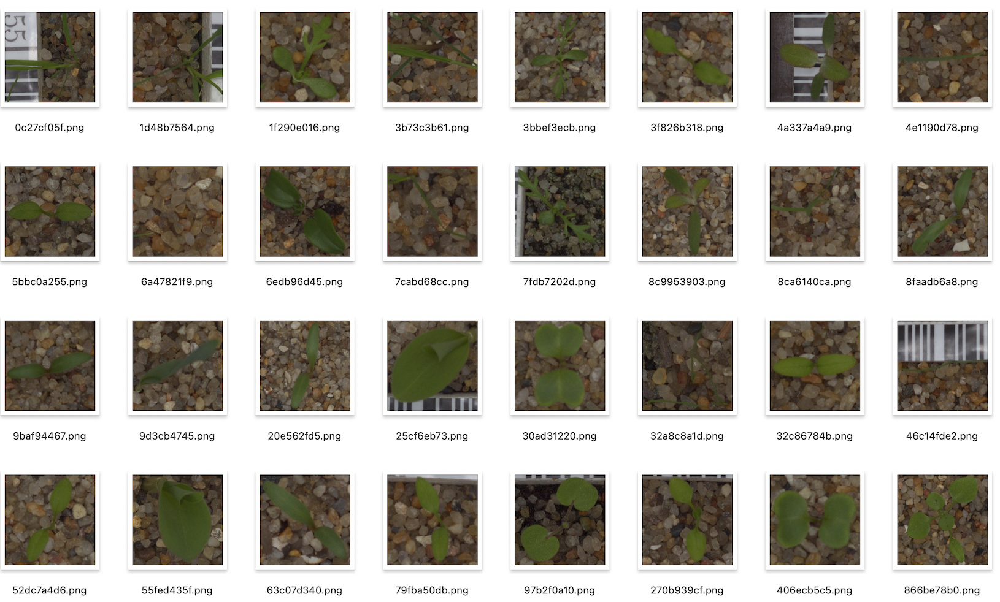

We will log each of these images and retrieve a single merged profile which summarizes our reference dataset.

In [3]:
#initialize a logger, loop over images, log each image
with session.logger(dataset_name="my_dataset") as ylog:
    for img_name in os.listdir('ref_images'):
        
        #skip hidden files
        if img_name.startswith('.'):
            continue

        ylog.log_image('ref_images/' + img_name)
    
    #retreive the merged profile after logging all images
    ref_profile = ylog.profile

The ref_profile variable contains the merged profile which can be inspected directly or saved to disk. 

## Determine Upper/Lower Bounds for Outlier Detection

We can view a DataFrame summarizing basic descriptive statistics as follows.

In [4]:
ref_profile.flat_summary()['summary']

,column,count,null_count,bool_count,numeric_count,max,mean,min,stddev,nunique_numbers,...,stddev_token_length,quantile_0.0000,quantile_0.0100,quantile_0.0500,quantile_0.2500,quantile_0.5000,quantile_0.7500,quantile_0.9500,quantile_0.9900,quantile_1.0000
0,ImagePixelHeight,50.0,0.0,0.0,50.0,348.000000,256.600000,200.000000,43.243969,42.0,...,0.0,200.000000,200.000000,206.000000,223.000000,238.000000,295.000000,339.000000,348.000000,348.000000
1,Saturation.mean,50.0,0.0,0.0,50.0,133.118583,106.978288,70.526584,14.525739,50.0,...,0.0,70.526581,70.526581,76.841797,99.801636,109.031487,115.896912,127.583023,133.118576,133.118576
2,Brightness.mean,50.0,0.0,0.0,50.0,102.638931,85.320648,68.139236,7.398150,50.0,...,0.0,68.139236,68.139236,72.738281,80.346413,85.925850,89.960281,98.015579,102.638931,102.638931
3,Colorspace,50.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Hue.mean,50.0,0.0,0.0,50.0,91.793389,34.675716,20.926153,17.558865,50.0,...,0.0,20.926153,20.926153,21.202171,24.560905,27.990950,35.659618,78.121925,91.793388,91.793388
5,Saturation.stddev,50.0,0.0,0.0,50.0,66.783720,41.839008,30.191123,9.619982,50.0,...,0.0,30.191124,30.191124,30.596041,34.422279,39.186146,48.162315,57.692020,66.783722,66.783722
6,Brightness.stddev,50.0,0.0,0.0,50.0,46.526409,21.712332,13.369270,6.703430,50.0,...,0.0,13.369269,13.369269,15.522024,17.655712,19.557896,24.192135,34.431507,46.526409,46.526409
7,Hue.stddev,50.0,0.0,0.0,50.0,92.326208,27.683247,4.272054,22.156002,50.0,...,0.0,4.272054,4.272054,8.594471,12.732874,17.269201,40.703945,71.224625,92.326210,92.326210
8,ImagePixelWidth,50.0,0.0,0.0,50.0,348.000000,256.600000,200.000000,43.243969,42.0,...,0.0,200.000000,200.000000,206.000000,223.000000,238.000000,295.000000,339.000000,348.000000,348.000000


There are many ways to define outliers. For this example, I will consider images to be outliers if their brightness falls within 3 standard deviations from the mean. Below, we retrieve the mean and standard deviation of the brightness for the reference dataset and calculate the upper and lower bounds for outlier detection.

In [5]:
ref_mean = ref_profile.to_summary().columns['Brightness.mean'].number_summary.mean
ref_stddev = ref_profile.to_summary().columns['Brightness.mean'].number_summary.stddev

#outliers defined as >3 standard deviations from mean
upper_bound = ref_mean + 3*ref_stddev
lower_bound = ref_mean - 3*ref_stddev

In [6]:
print('''reference mean: {} 
reference stddev: {} 
upper bound: {} 
lower bound: {}'''.format(ref_mean, ref_stddev, upper_bound, lower_bound))
      
      

reference mean: 85.32064777402698 
reference stddev: 7.3981499896450265 
upper bound: 107.51509774296206 
lower bound: 63.126197805091905


We now close this session.

In [7]:
session.close()

In this example, the upper and lower bounds are stored in memory, but users can alternatively save a reference profile to disk. 

In practice, users may wish to update their reference profile as models are retrained. In this scenario, we would want to calculate a new upper and lower bound for outlier detection as models are retrained and our reference dataset is updated. 


## Monitoring Production Image Data in WhyLabs

First, we need to import the WhyLabsWriter in order to upload profiles to the WhyLabs Platform.

In [8]:
from whylogs.app import Session
from whylogs.app.writers import WhyLabsWriter

Next, we provide the API Token, Org ID, and Model ID to which we wish to upload and start a new session using the WhyLabs Writer.

In [9]:
os.environ["WHYLABS_API_KEY"] = 'N9qZfDHzXe.REM8js6gF8meUgkOz2HNUpXJl39nXjFfswWXdsVXpuu5CoNUGGi2q'
os.environ["WHYLABS_DEFAULT_ORG_ID"] = 'org-5j4PYZ'
model_id= 'model-19'

# Creating instance of the WhyLabs Writer to utilize WhyLabs platform
writer = WhyLabsWriter()

# Open a session
session = Session(project="demo-project", pipeline="demo-pipeline", writers=[writer])

Now we will log each image. If the image is detected to be an outlier, we also upload the image name, the feature containing the outlier (brightness), and the feature’s value. 

In [11]:
#loop over each production image in the target_images folder
for img_name in os.listdir('target_images'):
    
    #skip hidden files
    if img_name.startswith('.'):
        continue
    
    #initialize a logger pointing to the desired model
    with session.logger(tags={"datasetId": model_id}) as ylog:    
        
        #log image
        ylog.log_image('target_images/' + img_name)
        
        #fetch the brightness of the target image
        target_brightness = ylog.profile.to_summary().columns['Brightness.mean'].number_summary.mean
        
        #if image is an outlier, log the image name along with brightness value
        if not lower_bound < target_brightness < upper_bound:
            outlier_record = '{}/{}/{}'.format(img_name, 'brightness', round(target_brightness, 2))
            ylog.log({'outlier_details': outlier_record})

Upon navigating to the WhyLabs platform, we view all of the telemetric data captured by whylogs for our production images. By examining the brightness feature in the profile viewer, we can see a well defined distribution with a few obvious outliers on either end. 

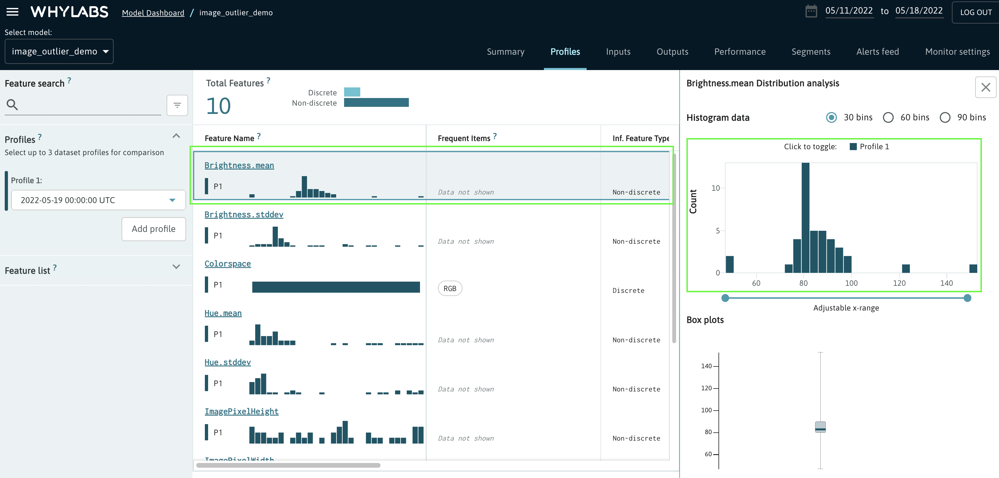

When selecting the **outlier_details** feature in the profile view, we see details for each of the 4 detected outliers in the “Frequent Items” list. This list tells me:

* Which images were detected as outliers
* Which feature contains the outliers
* What the feature’s value was

This approach can be easily extended to record outliers for other features tracked by whylogs such as hue, saturation, image width, etc.

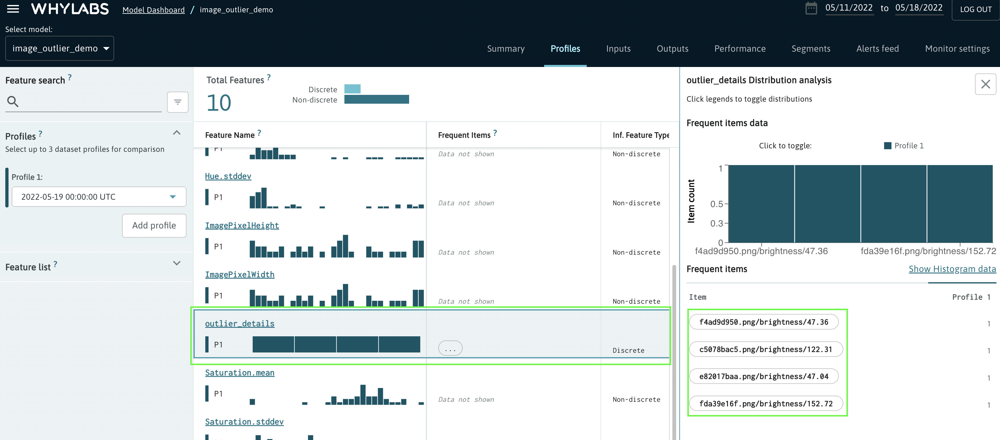


Upon observing these outliers directly, we find that two of them are significantly darker than the others and two others have mostly white backgrounds, unlike most other images. 

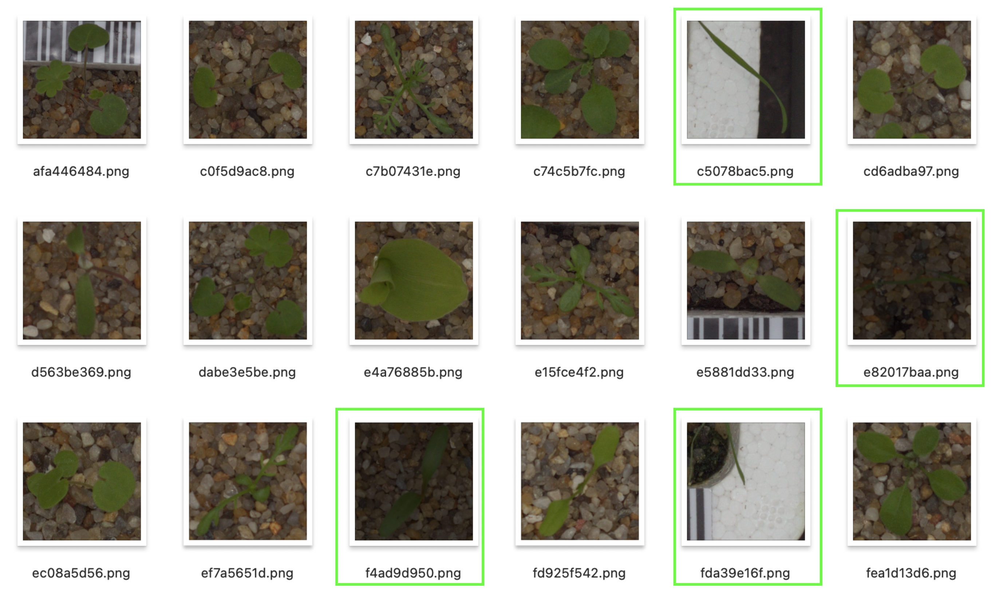

## Summary

WhyLabs and whylogs are designed to monitor for data drift and data quality issues impacting your dataset as a whole. Nonetheless, users have the ability to customize their solution to identify individual records that were detected as outliers as well.
